In [35]:
import pandas as pd
import numpy as np
import transformers
import torch
import torch.nn as nn
from transformers import AutoTokenizer, Trainer, TrainingArguments, BertConfig, BertForSequenceClassification, AutoModelForSequenceClassification, EarlyStoppingCallback, RobertaTokenizerFast
from scipy.stats import spearmanr
from transformers.integrations import TensorBoardCallback
from torch.utils.data import Dataset
import pandas as pd
import numpy as np
from sklearn.metrics import accuracy_score, precision_recall_fscore_support, mean_squared_error
from sklearn.utils import shuffle
import re
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import seaborn as sns
from datetime import datetime


In [2]:
device = torch.device('cuda')

In [3]:
model_path = '../models/SingleLayerProberta/checkpoint-70000'
tokenizer_name = '../models/proberta512'

In [6]:
df = pd.read_csv('../Datasets/DegreesWithMultipleAugmentations.csv',index_col=0)

In [8]:
model = AutoModelForSequenceClassification.from_pretrained(model_path, num_labels=1)
model.to(device)
model.eval()
model.zero_grad()
tokenizer = RobertaTokenizerFast.from_pretrained(tokenizer_name, max_length=512, do_lower_case=False)

Some weights of the model checkpoint at ../models/SingleLayerProberta/checkpoint-70000 were not used when initializing RobertaForSequenceClassification: ['lm_head.layer_norm.bias', 'lm_head.layer_norm.weight', 'lm_head.dense.bias', 'lm_head.bias', 'lm_head.dense.weight']
- This IS expected if you are initializing RobertaForSequenceClassification from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing RobertaForSequenceClassification from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at ../models/SingleLayerProberta/checkpoint-70000 and are newly initialized: ['classifier.out_proj.weight', 'classifier.dense.weight'

In [24]:
tokenizer

PreTrainedTokenizerFast(name_or_path='../models/proberta512', vocab_size=10000, model_max_len=1000000000000000019884624838656, is_fast=True, padding_side='right', truncation_side='right', special_tokens={'bos_token': AddedToken("<s>", rstrip=False, lstrip=False, single_word=False, normalized=True), 'eos_token': AddedToken("</s>", rstrip=False, lstrip=False, single_word=False, normalized=True), 'unk_token': AddedToken("<unk>", rstrip=False, lstrip=False, single_word=False, normalized=True), 'sep_token': AddedToken("</s>", rstrip=False, lstrip=False, single_word=False, normalized=True), 'pad_token': AddedToken("<pad>", rstrip=False, lstrip=False, single_word=False, normalized=True), 'cls_token': AddedToken("<s>", rstrip=False, lstrip=False, single_word=False, normalized=True), 'mask_token': AddedToken("<mask>", rstrip=False, lstrip=True, single_word=False, normalized=True)})

In [10]:
model

RobertaForSequenceClassification(
  (roberta): RobertaModel(
    (embeddings): RobertaEmbeddings(
      (word_embeddings): Embedding(10000, 768, padding_idx=1)
      (position_embeddings): Embedding(514, 768, padding_idx=1)
      (token_type_embeddings): Embedding(1, 768)
      (LayerNorm): LayerNorm((768,), eps=1e-12, elementwise_affine=True)
      (dropout): Dropout(p=0.1, inplace=False)
    )
    (encoder): RobertaEncoder(
      (layer): ModuleList(
        (0): RobertaLayer(
          (attention): RobertaAttention(
            (self): RobertaSelfAttention(
              (query): Linear(in_features=768, out_features=768, bias=True)
              (key): Linear(in_features=768, out_features=768, bias=True)
              (value): Linear(in_features=768, out_features=768, bias=True)
              (dropout): Dropout(p=0.1, inplace=False)
            )
            (output): RobertaSelfOutput(
              (dense): Linear(in_features=768, out_features=768, bias=True)
              (LayerN

In [49]:
s = df['Sequence'][3]
s = (' '.join(list(s)))
inputs = tokenizer(s, return_tensors='pt', truncation=True, max_length=512)
print(len(inputs.input_ids[0]))

512


(512, 512)
1305


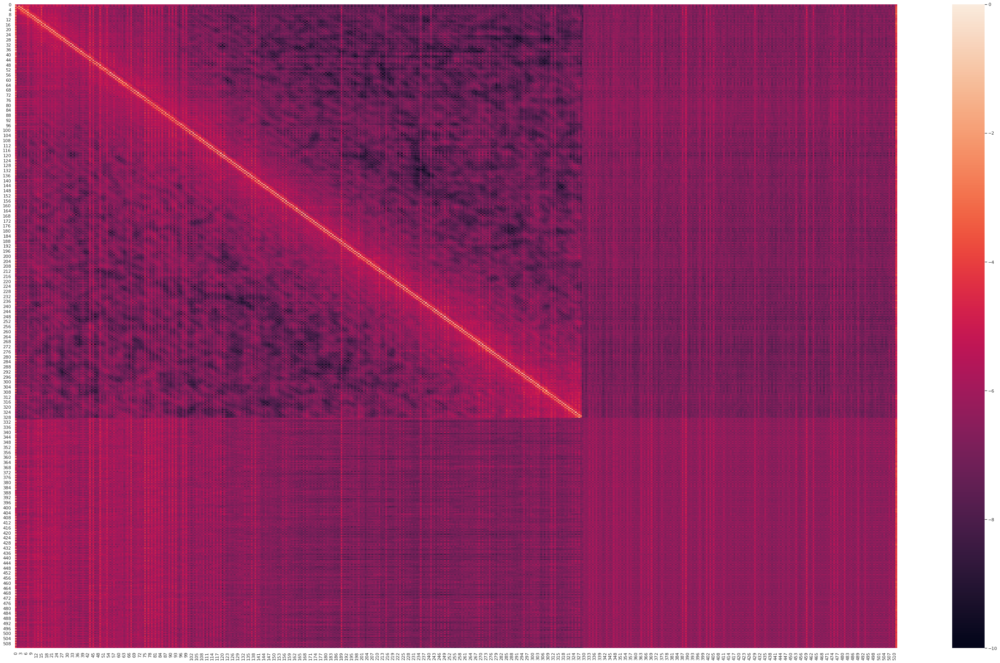

In [53]:
def heatmap(model, df, tokenizer, max_length, index, save):
    fig, ax = plt.subplots(figsize=(50,30))
    s = df['Sequence'][index]
    s = (' ').join(list(s))
    inputs = tokenizer(s, return_tensors='pt', truncation=True, max_length=max_length)
    inputs.to(device)
    outputs = model(inputs['input_ids'], output_attentions=True)
    attention = outputs[1]
    summed = attention[0]
    num = summed.cpu().detach().numpy()

    cls_attention = num[0][0]
    cls_attention = np.log(cls_attention)
    cls_attention.shape
    attention_layer = np.array(cls_attention)
    print(attention_layer.shape)
    print(len(s))
    sns.set()
    ax = sns.heatmap(attention_layer, vmin=-10, vmax=0)
    
    if save:
        now = datetime.now()
        d4 = now.strftime("%d-%m-%Y-%H:%M:%S")
        plt.savefig('HeatmapImages/' + d4 + '.png')
    else:
        plt.show()
    return
heatmap(model, df, tokenizer, 512, 4, False)

(512, 512)
789
(249, 249)
247
(512, 512)
539
(512, 512)
1615
(512, 512)
1305
(512, 512)
1591
(512, 512)
713
(512, 512)
745
(512, 512)
845
(512, 512)
3631
(512, 512)
1239
(512, 512)
555


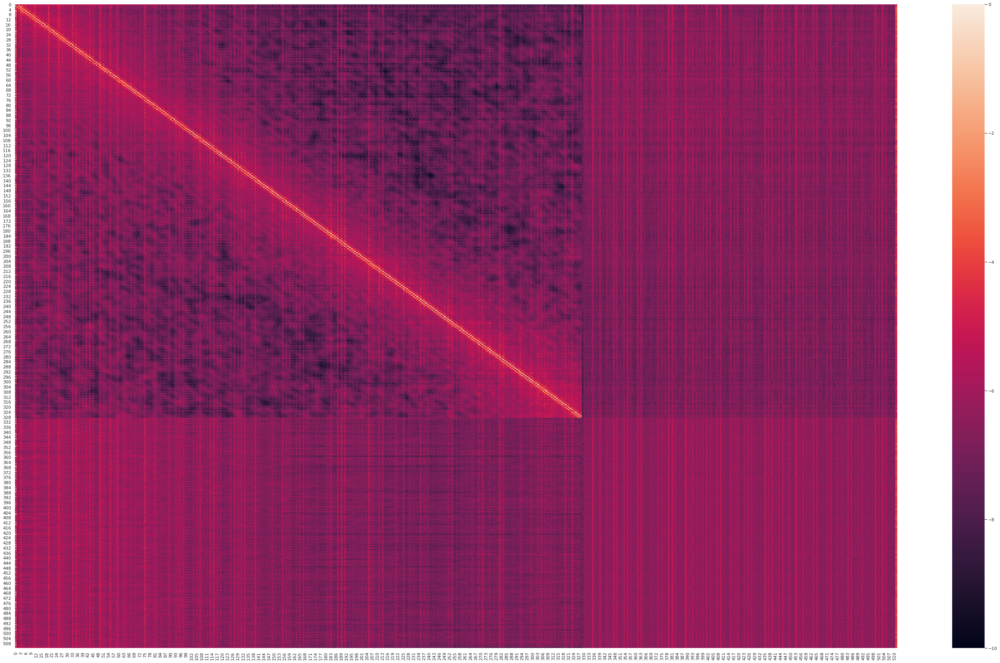

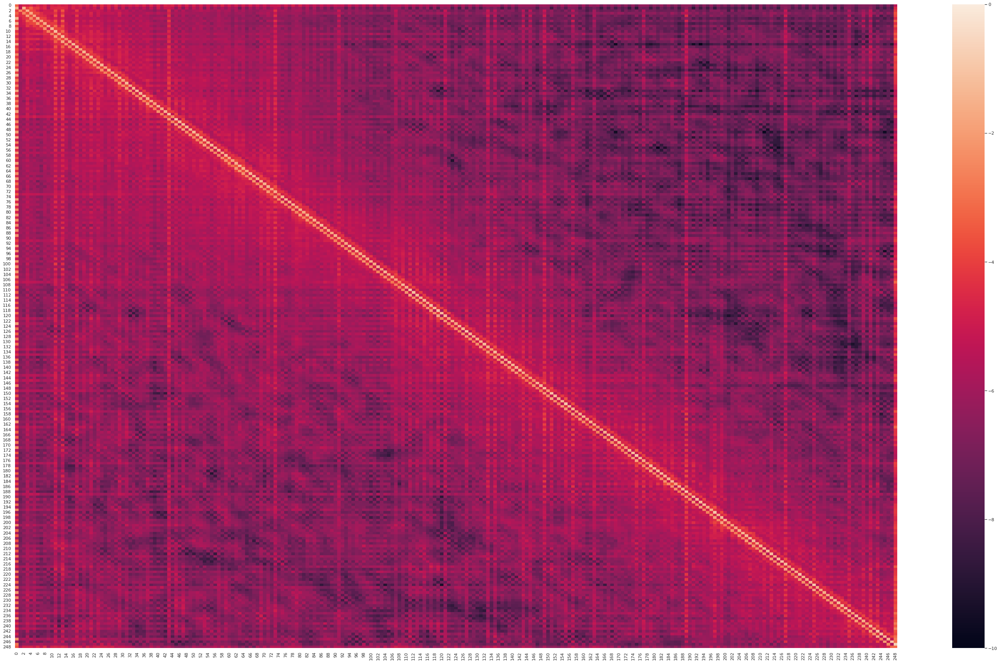

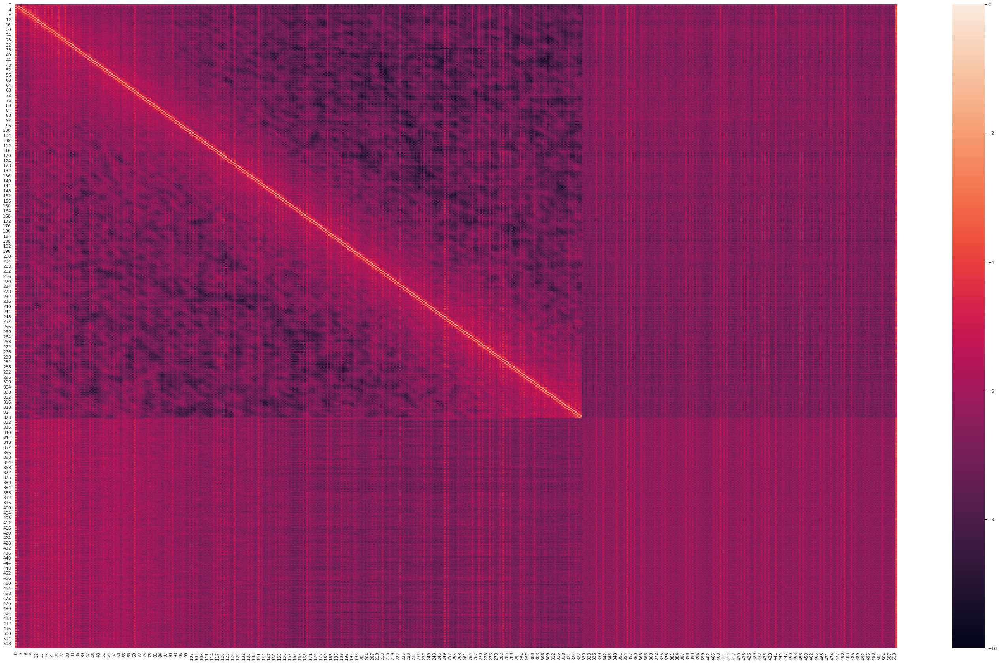

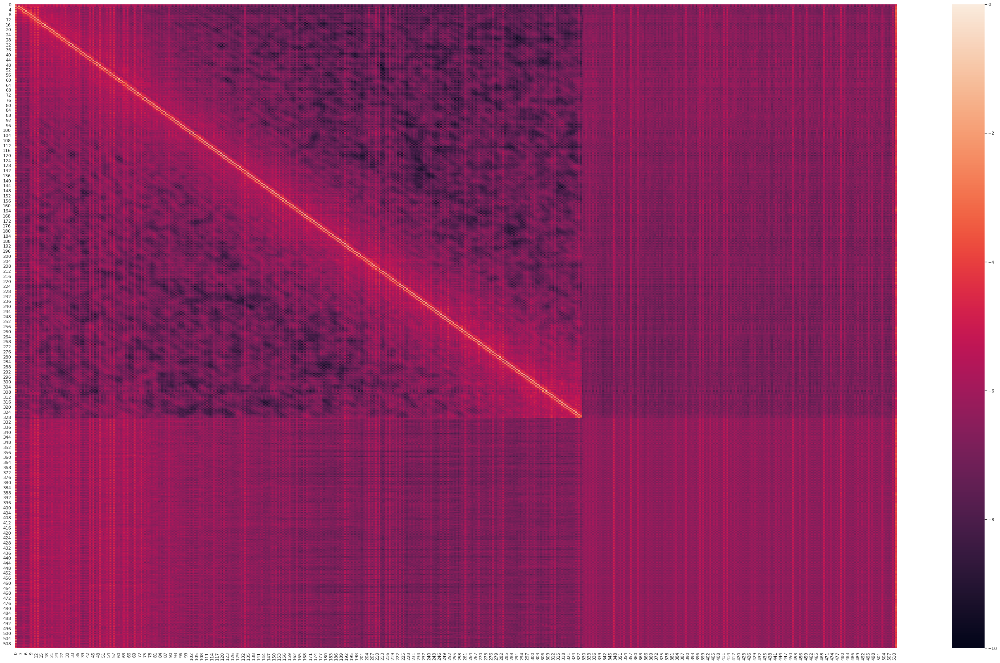

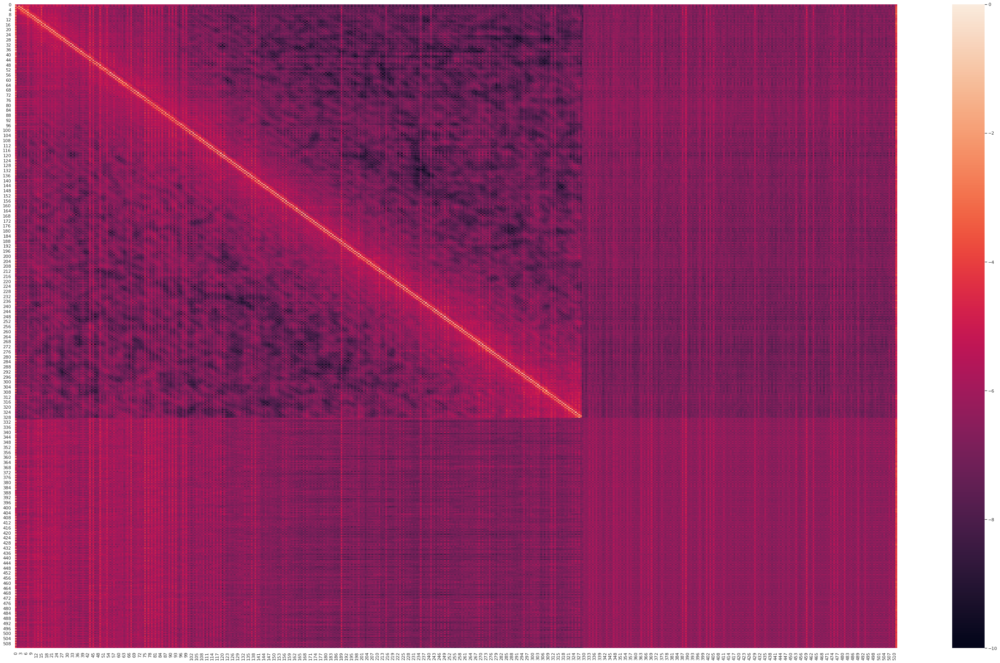

...

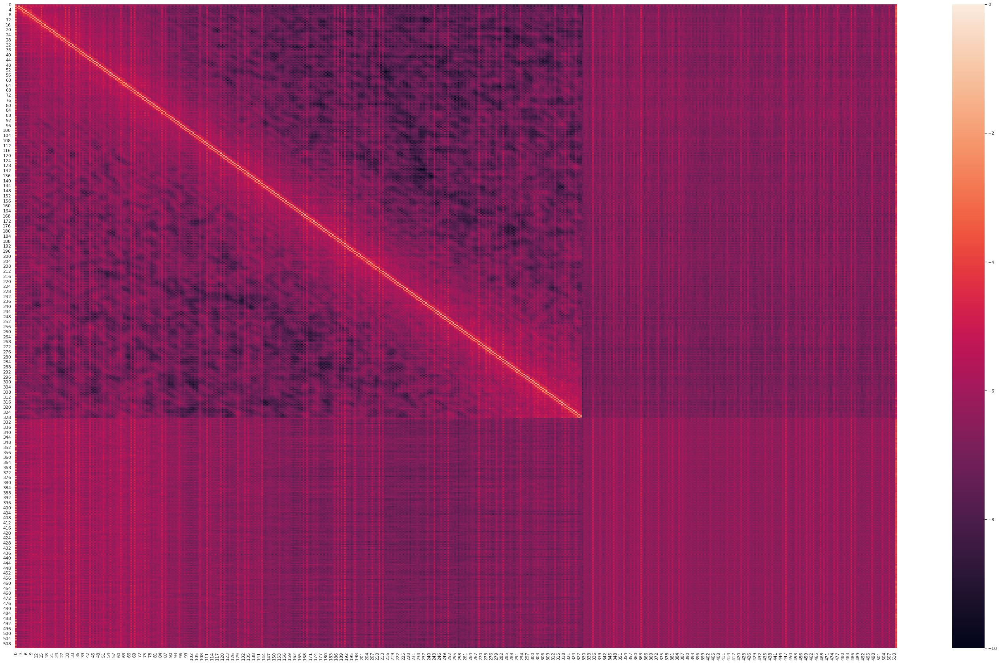

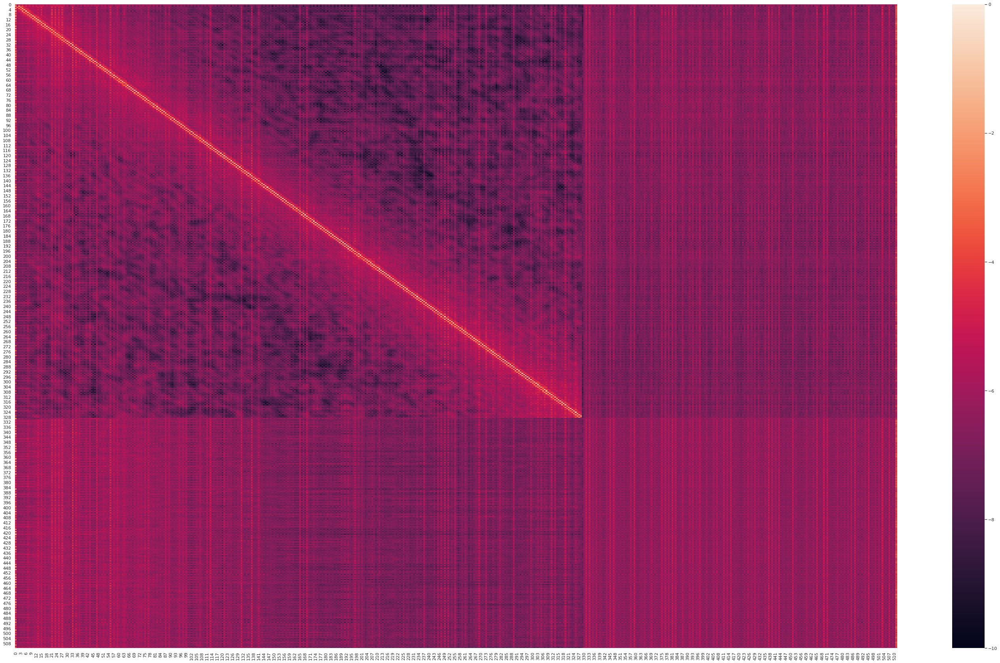

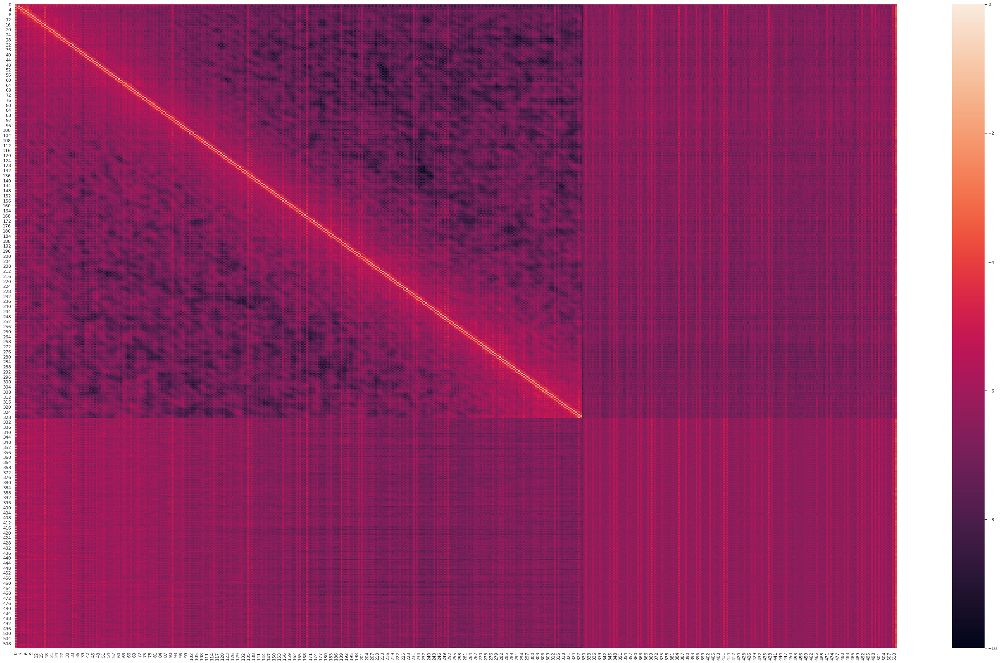

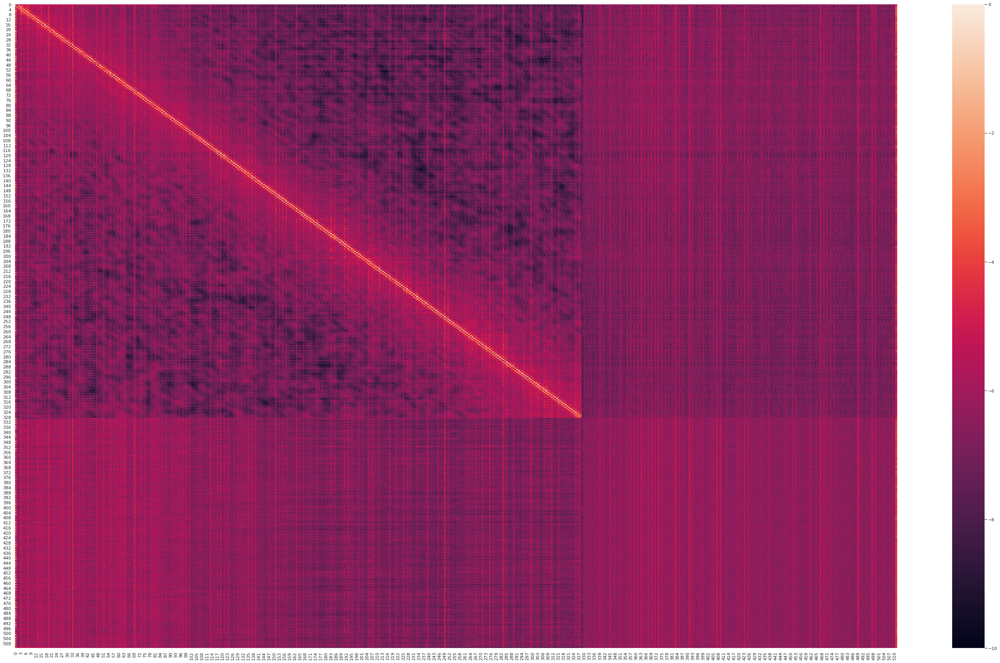

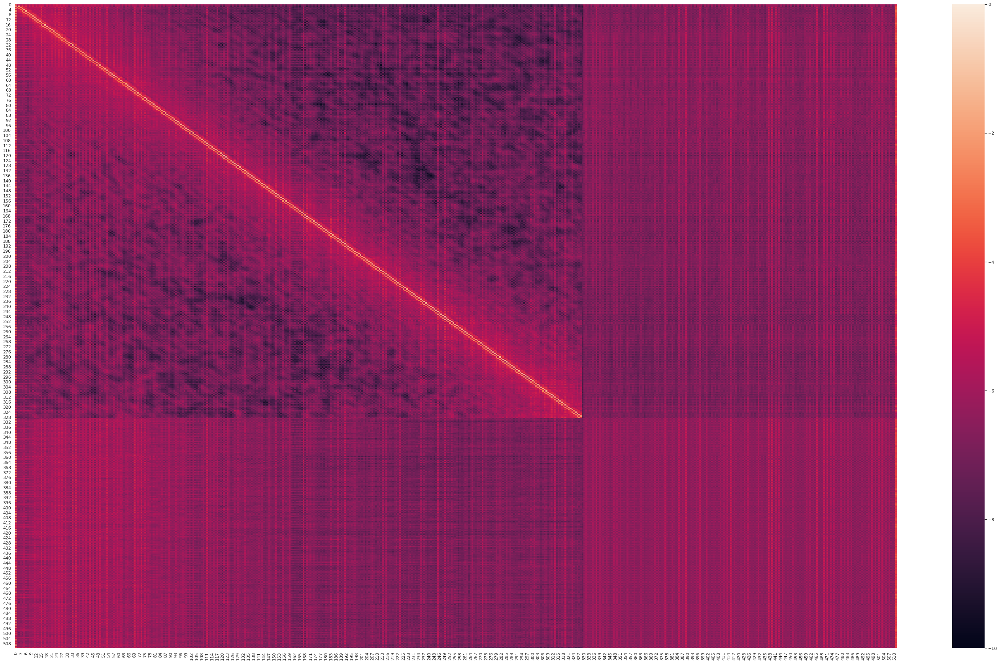

In [39]:
for i in range(12):
    heatmap(model, df, tokenizer, 512, i, True)